# 1. Learning Objective & Mission
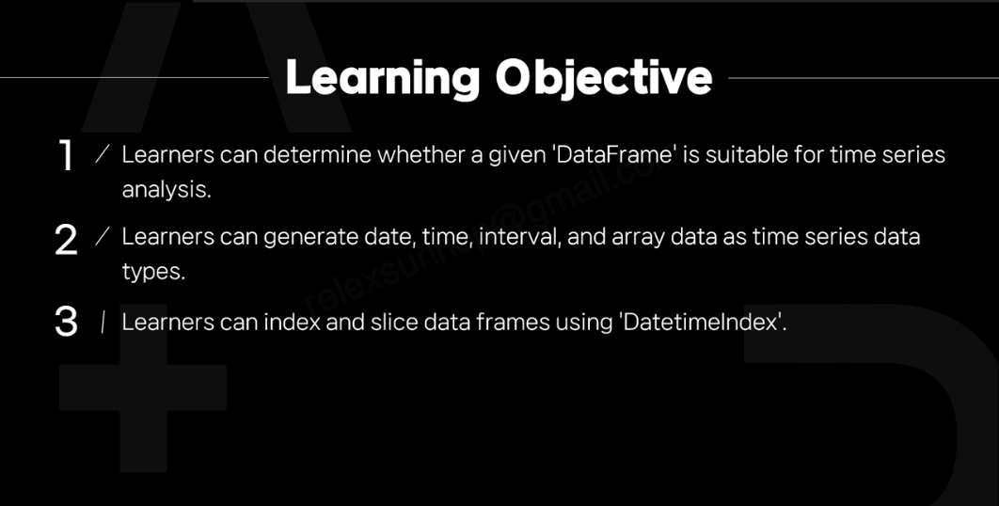

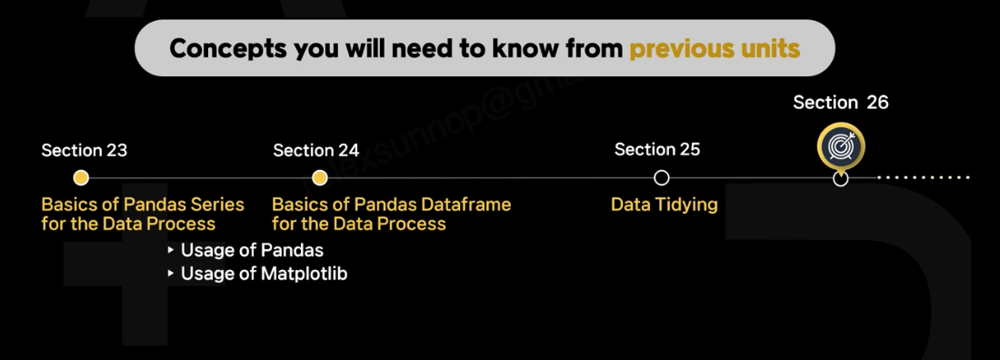

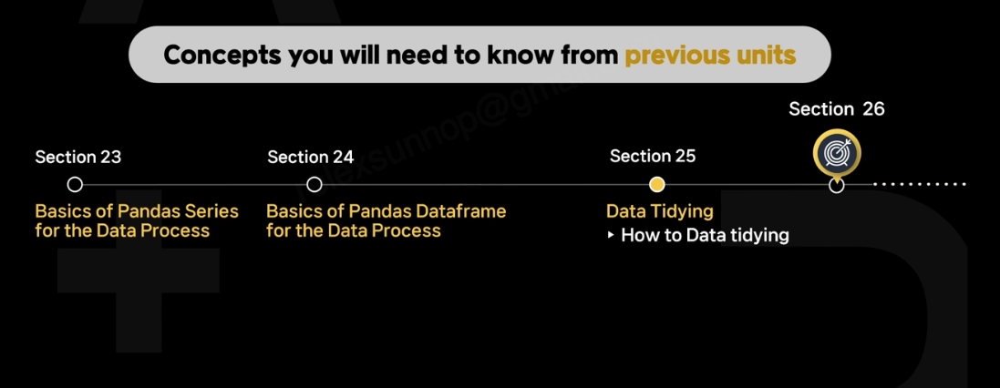

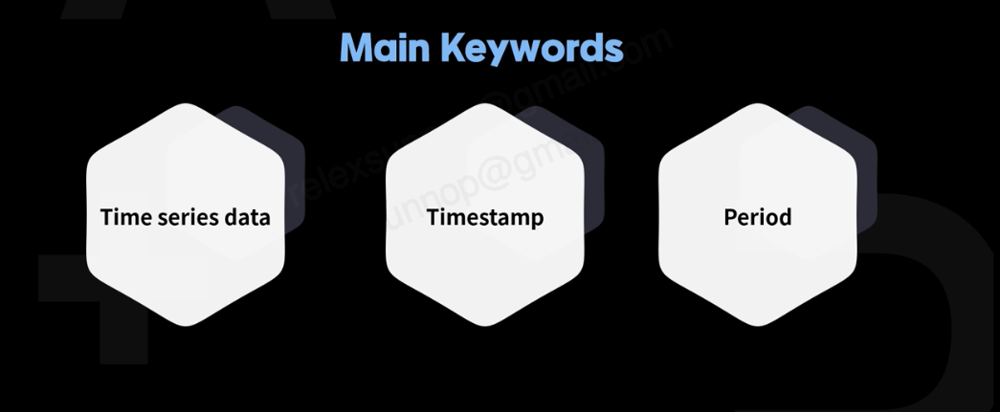

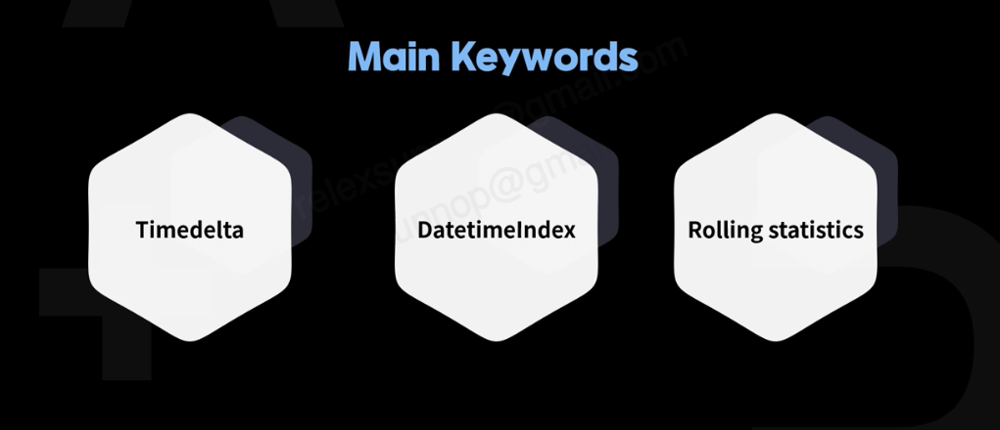

...

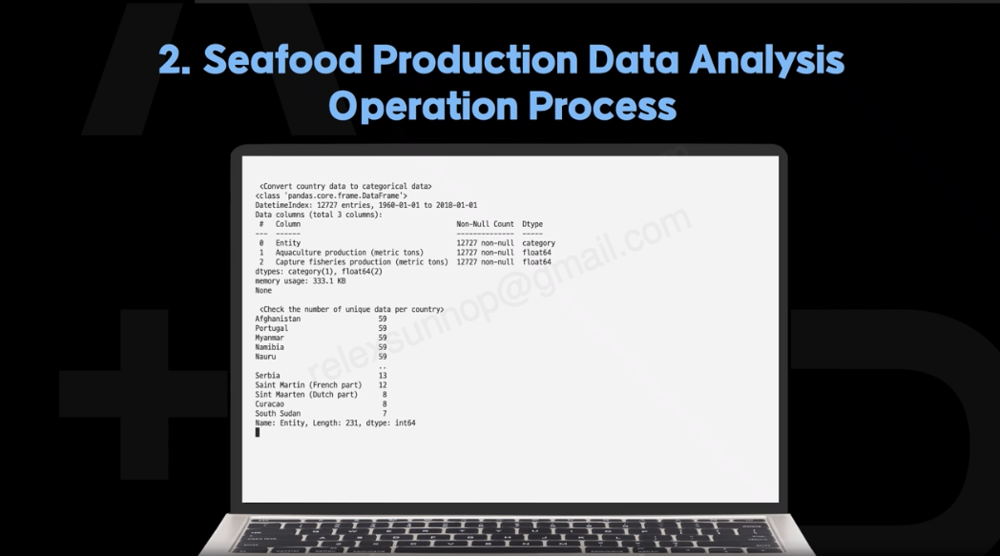

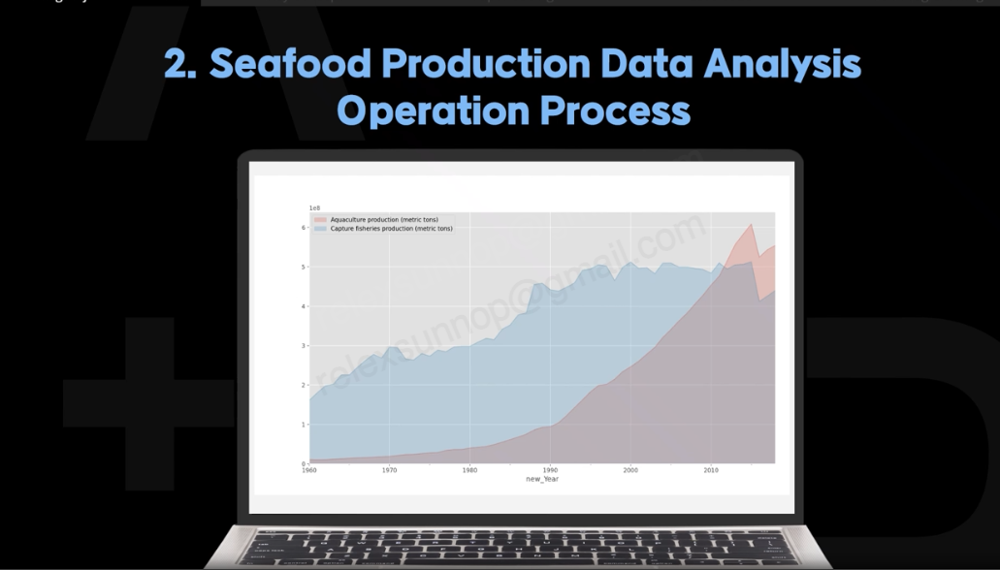

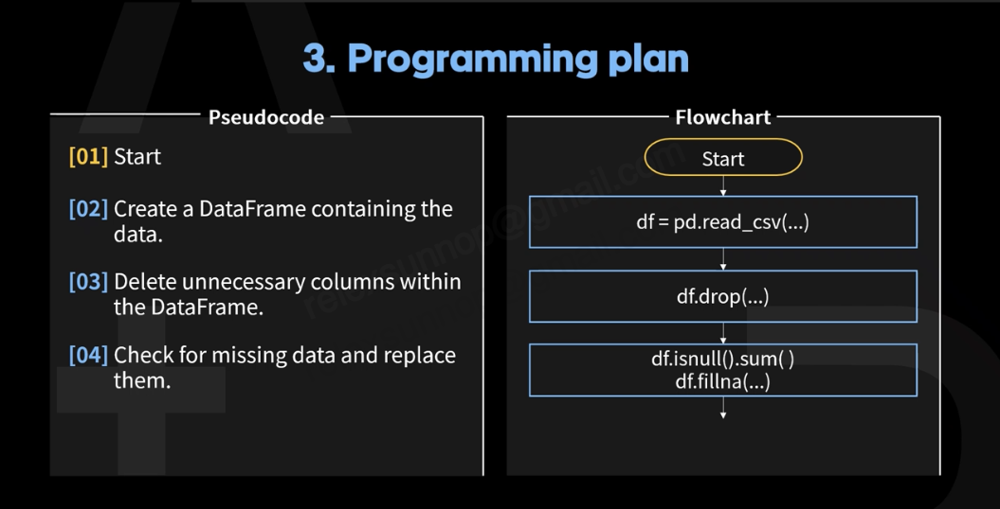

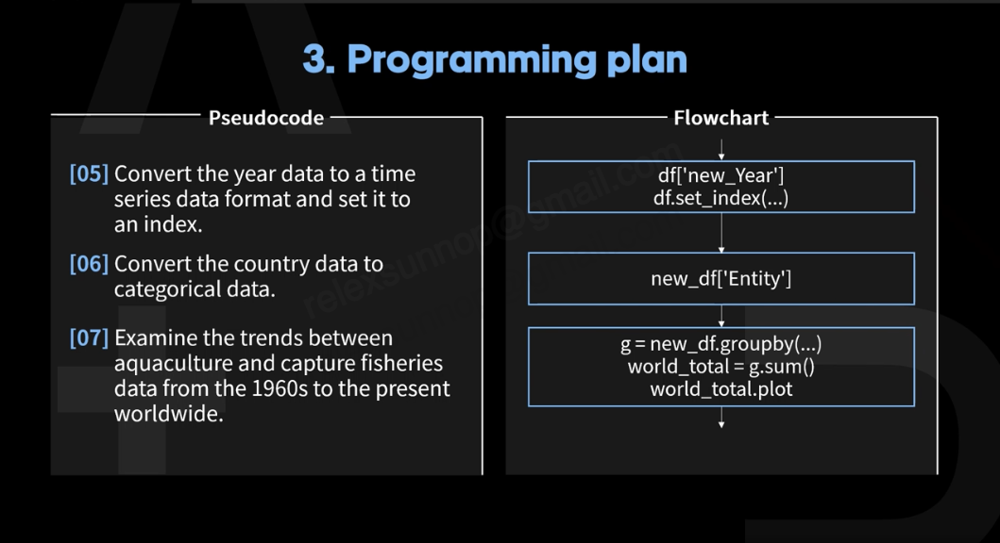

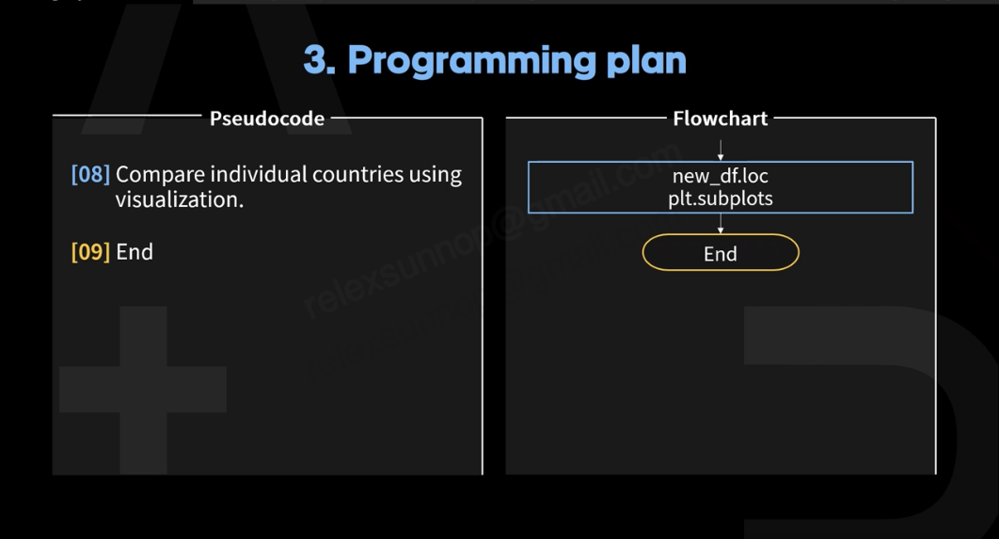

---

# 2. Key concept
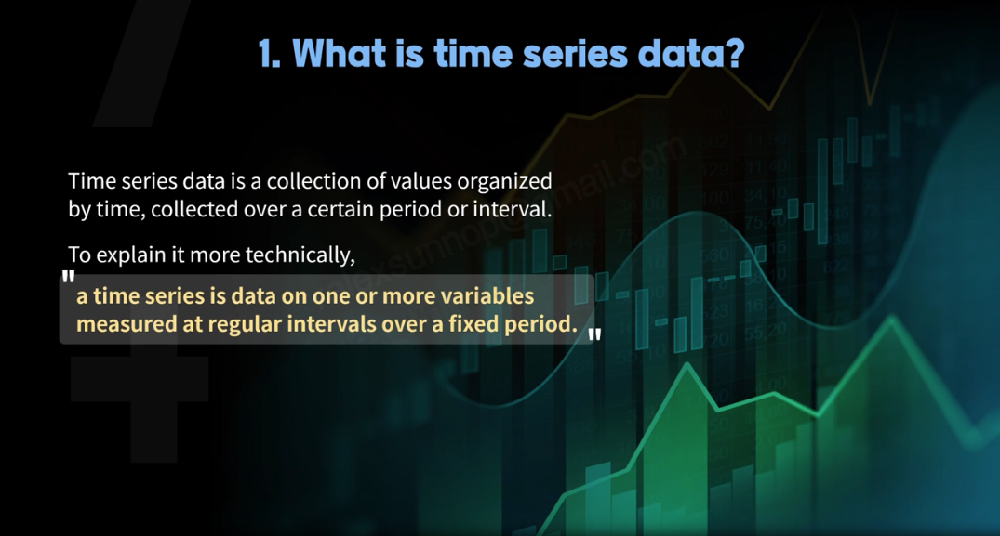

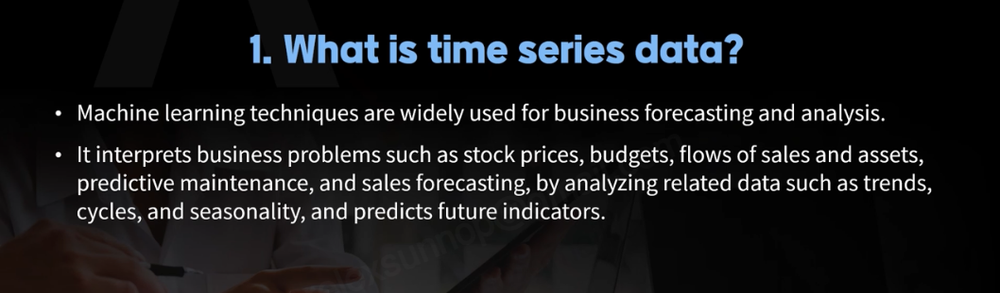

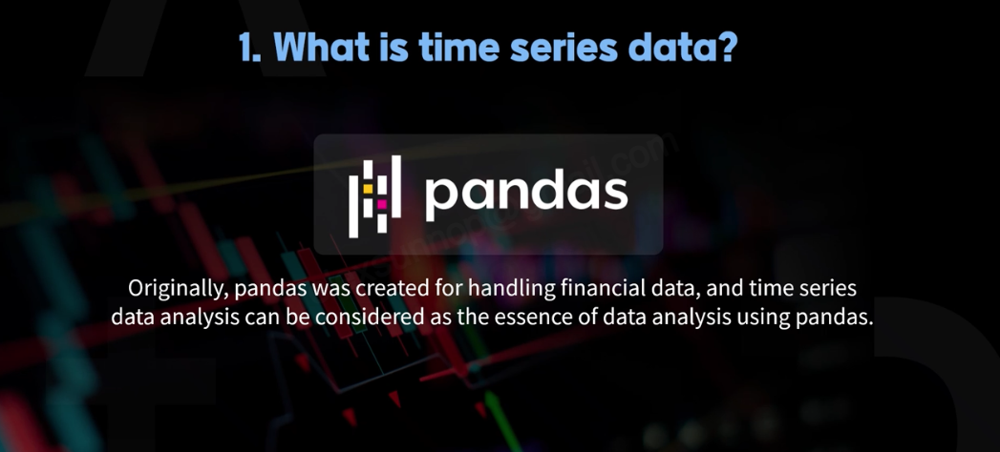

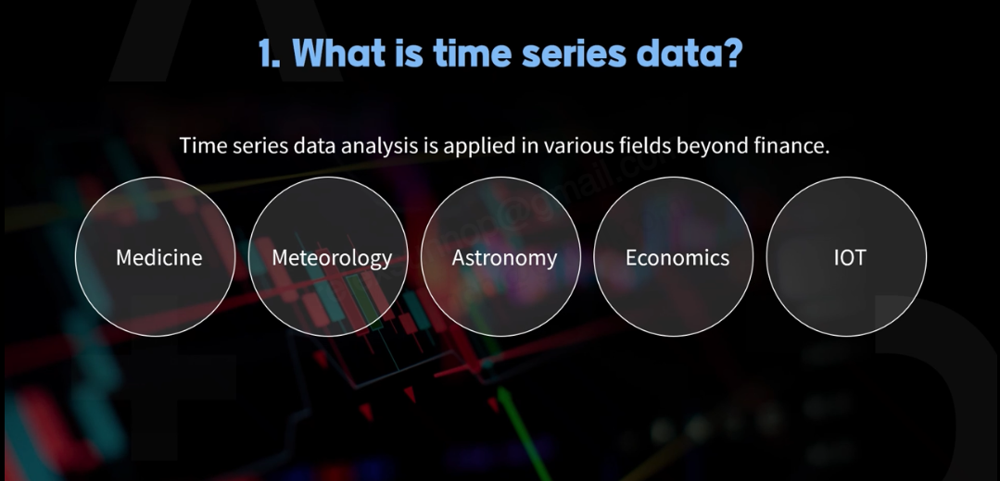

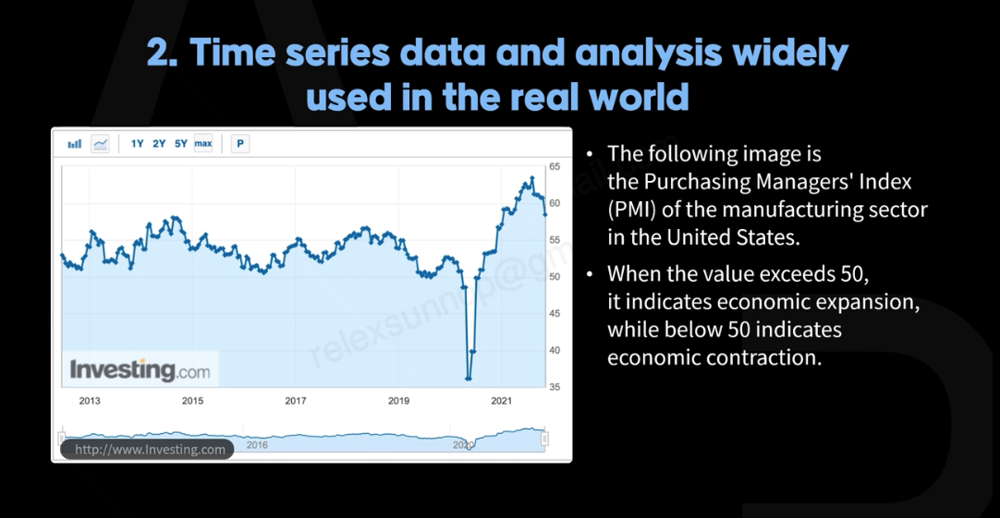

...

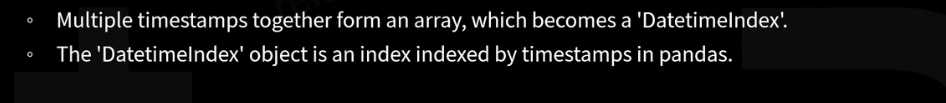

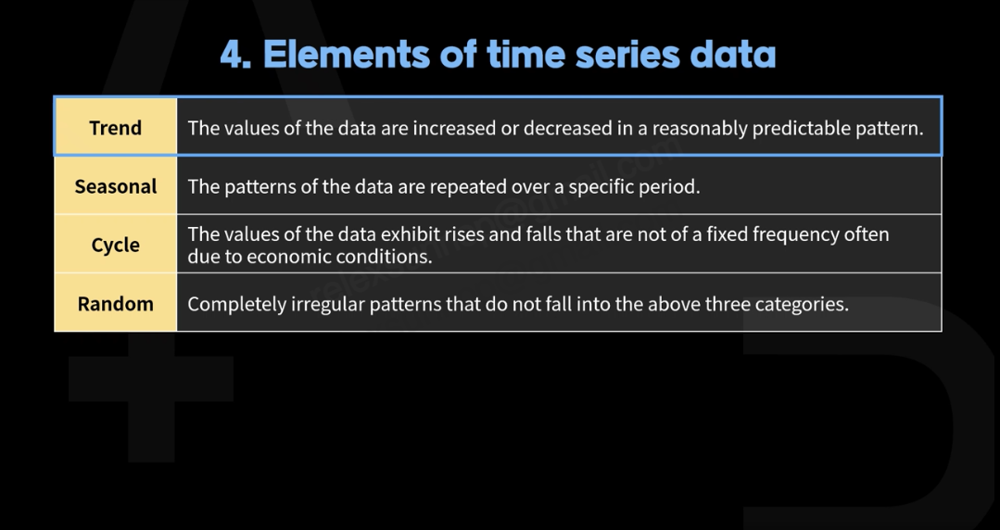

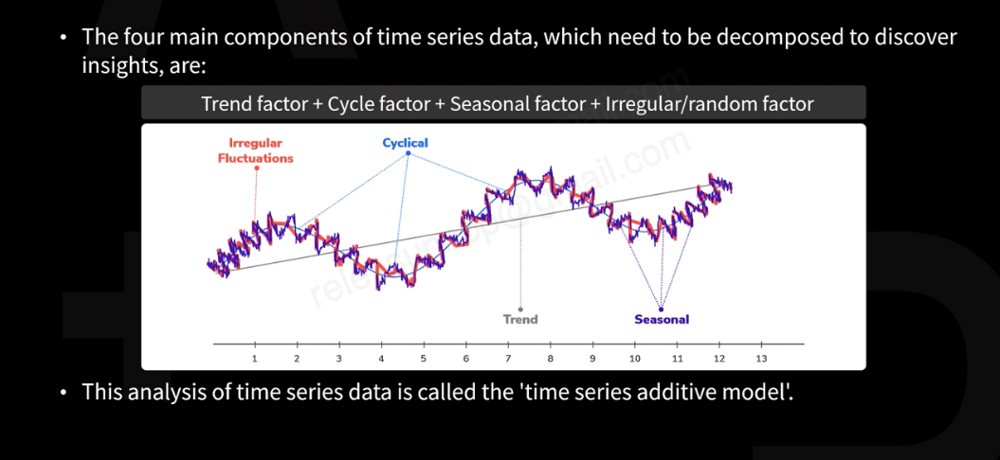

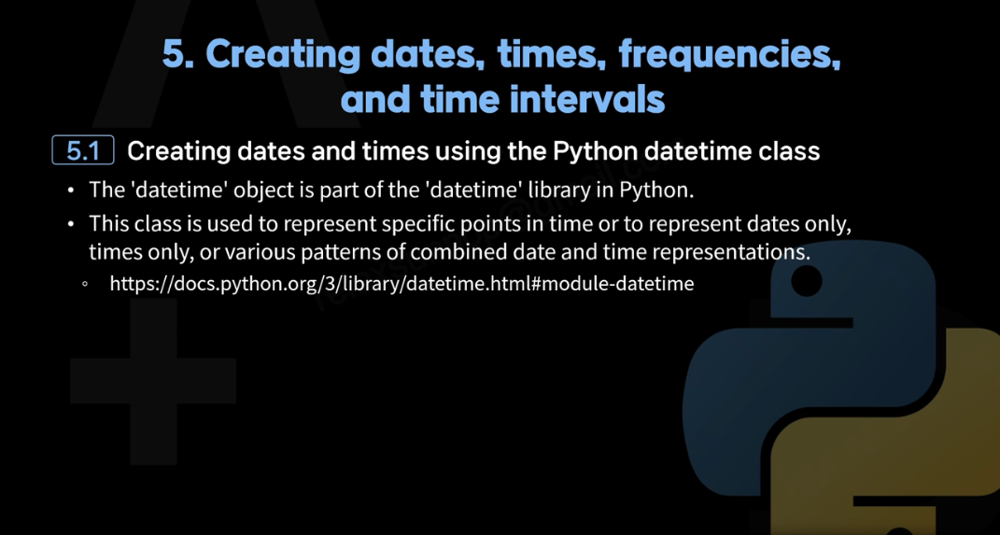

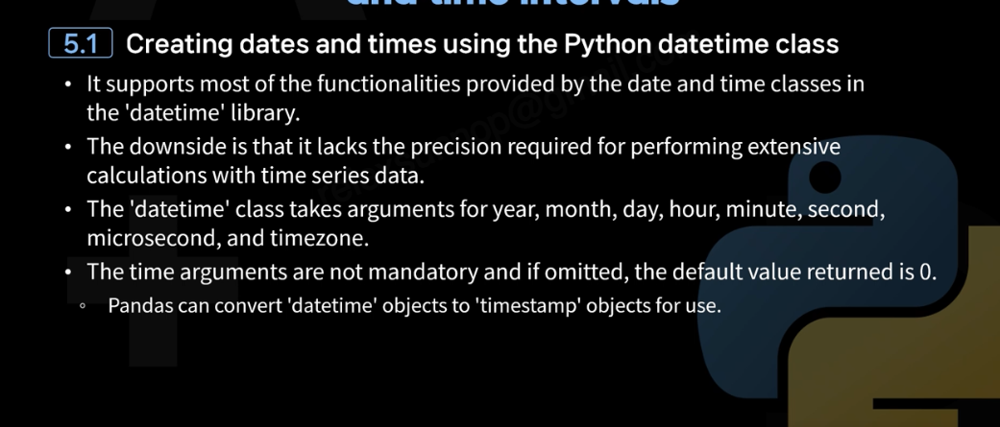

In [1]:
import pandas as pd
import numpy as np
import datetime 

from datetime import date, datetime, time, timezone

datetime(2021, 7, 7)

datetime.datetime(2021, 7, 7, 0, 0)

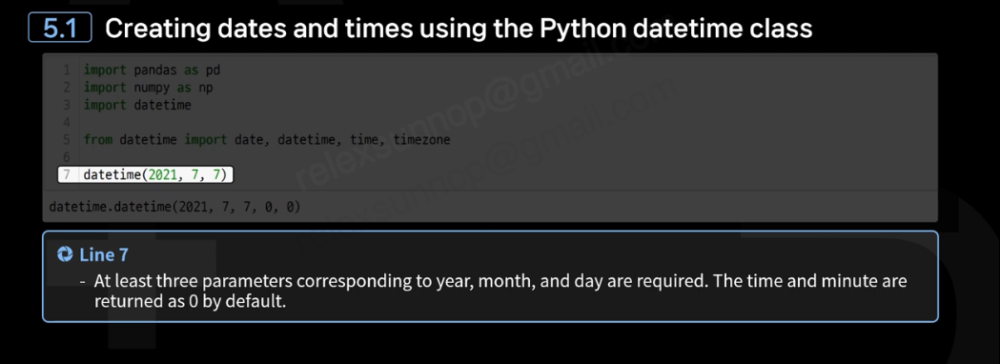

In [2]:
datetime(2021, 7, 7, 15, 50)

datetime.datetime(2021, 7, 7, 15, 50)

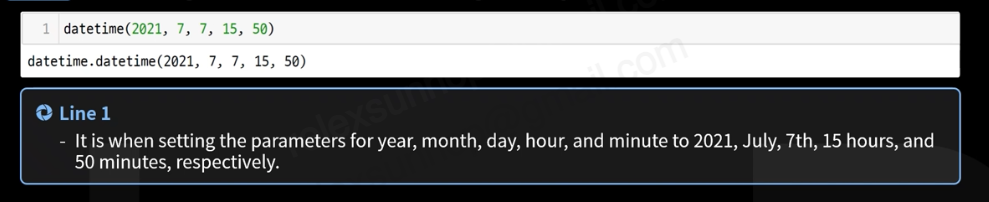

In [3]:
d = date(2021, 7, 7)
t = time(13, 26, 10)
datetime.combine(d, t)

datetime.datetime(2021, 7, 7, 13, 26, 10)

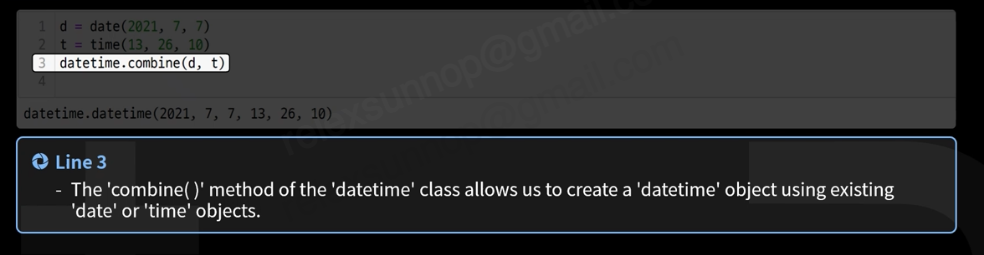

In [6]:
datetime.now() ## Current date and time with local time zone.

datetime.datetime(2023, 9, 27, 9, 2, 27, 467216)

In [7]:
## Using the 'now' method with a time zone as a parameter, a 'datetime' object with the 
## corresponding timezone is created.
datetime.now(timezone.utc)

datetime.datetime(2023, 9, 27, 2, 3, 33, 886612, tzinfo=datetime.timezone.utc)

In [9]:
datetime.now().date() ## Determining the current time and date and returning only the date.

datetime.date(2023, 9, 27)

In [10]:
datetime.now().time() ## Determining the current time and date and returning only the time.

datetime.time(9, 5, 7, 443291)

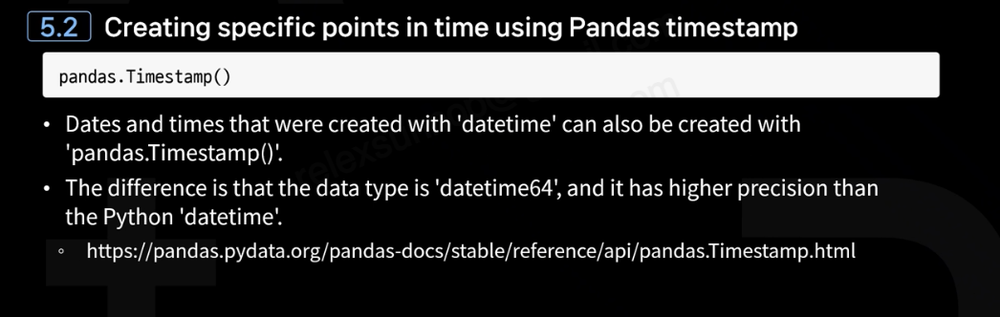

In [12]:
pd.Timestamp('2017, 1, 15') 
## Both the date and time can be set when creating the timestamp. 

Timestamp('2017-01-15 00:00:00')

In [14]:
pd.Timestamp('2017, 5, 3, 12:00') 
## Creating a timestamp with specified date and time.

Timestamp('2017-05-03 12:00:00')

In [16]:
pd.Timestamp('12:00')
## If only the time is specified, the default value is today's date.

Timestamp('2023-09-27 12:00:00')

- So far, we have learned how to create specific moments in date and time.
- Now, we will learn how to represent time intervals.

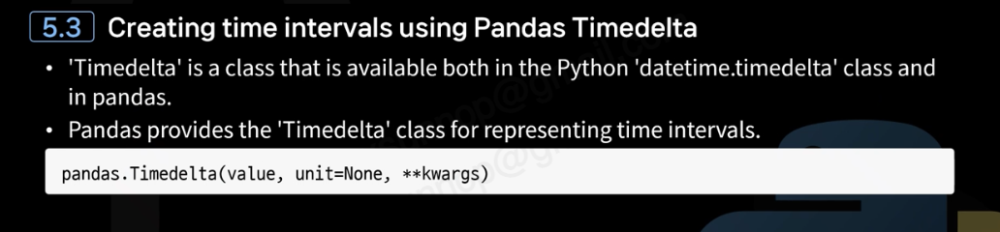

- Time intervals are important in time series data analysis for determining elapsed days or when analysing specific time intervals.

In [18]:
import pandas as pd
import datetime
from datetime import datetime

my_birth = datetime(1973, 7, 7) ## Creating a specific date with 'datetime'.
today = datetime.today() ## Creating today's date.
tomorrow = today + pd.Timedelta(days = 1) ## Calculating a date one day ahead using 'timedelta'.

## Printing how much time has passed since my birthday until tomorrow.
print(tomorrow - my_birth)

18345 days, 9:16:19.229173


In [20]:
## When calculating the number of days between two dates, it returns the data in the 'timedelta' format.
my_birth - today

datetime.timedelta(days=-18345, seconds=53020, microseconds=770827)

In [22]:
today = datetime.today()

## Arithmetic calculations can also be performed on time defferences.
data = today + pd.Timedelta(hours = 10)

print(today)
print(data) ## We can see that 10 hours have been added to 'today'.

2023-09-27 09:21:03.055201
2023-09-27 19:21:03.055201


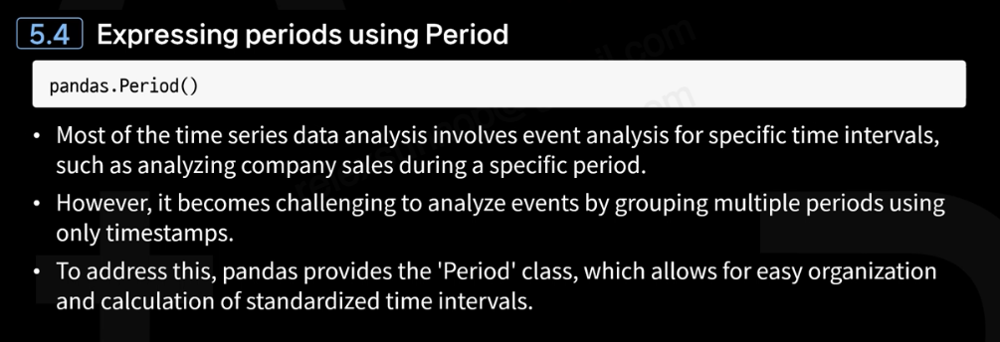

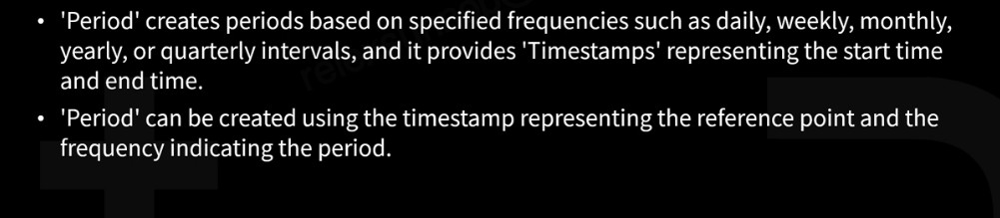

In [24]:
import pandas as pd

special_day = pd.Period('1973-7', freq = 'M')
special_day

Period('1973-07', 'M')

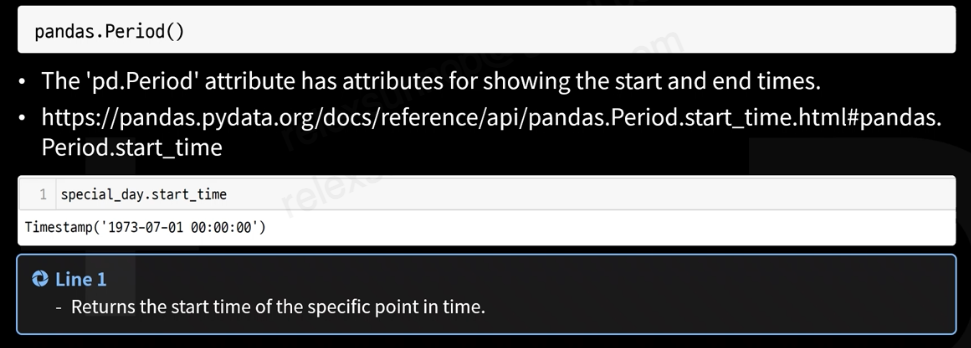

In [25]:
special_day.start_time

Timestamp('1973-07-01 00:00:00')

In [26]:
special_day.end_time

Timestamp('1973-07-31 23:59:59.999999999')

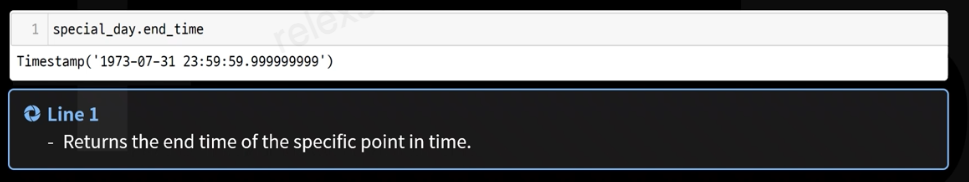

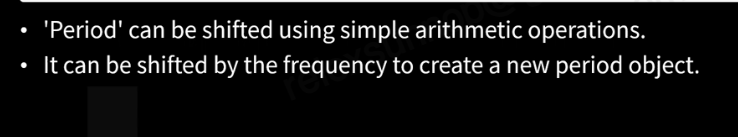

In [27]:
n = special_day + 2 ## It can be understood as shifting the period by the specified unit.

print(special_day)
print(n)

1973-07
1973-09


In [30]:
## The result shows that pandas correctly identifies 
## the entires of September 1973(which has 30 days).
n.start_time, n.end_time

(Timestamp('1973-09-01 00:00:00'), Timestamp('1973-09-30 23:59:59.999999999'))

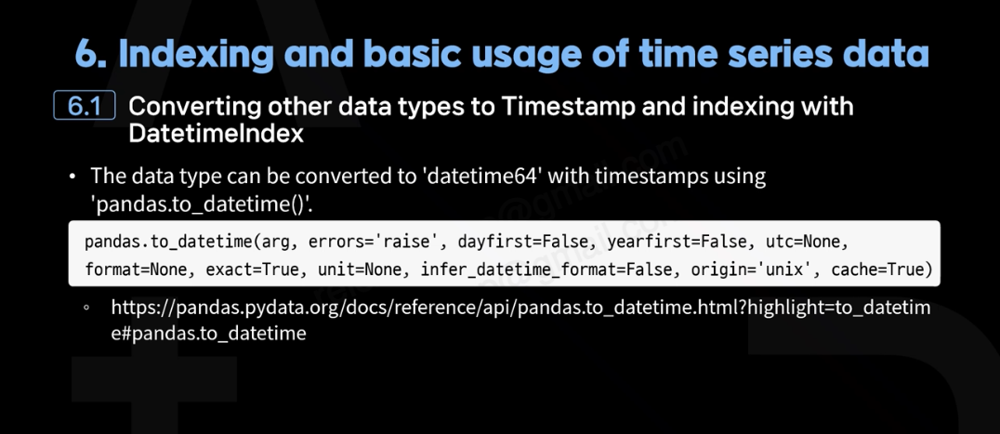

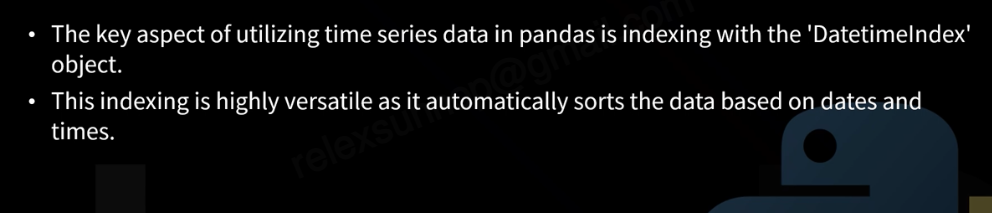

In [32]:
import pandas as pd
wti = pd.read_csv("./data/DCOILWTICO.csv")
wti.head()

,DATE,DCOILWTICO
0,2018-09-18,69.87
1,2018-09-19,71.08
2,2018-09-20,70.77
3,2018-09-21,70.8
4,2018-09-24,73.23


In [33]:
wti.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1305 entries, 0 to 1304
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   DATE        1305 non-null   object
 1   DCOILWTICO  1305 non-null   object
dtypes: object(2)
memory usage: 20.5+ KB


In [34]:
wti['N_DATE'] = pd.to_datetime(wti['DATE'])
wti['N_DATE'] ## The date type has been changed to 'datetime64'.

0      2018-09-18
1      2018-09-19
2      2018-09-20
3      2018-09-21
4      2018-09-24
          ...    
1300   2023-09-12
1301   2023-09-13
1302   2023-09-14
1303   2023-09-15
1304   2023-09-18
Name: N_DATE, Length: 1305, dtype: datetime64[ns]

In [35]:
wti.head()

,DATE,DCOILWTICO,N_DATE
0,2018-09-18,69.87,2018-09-18
1,2018-09-19,71.08,2018-09-19
2,2018-09-20,70.77,2018-09-20
3,2018-09-21,70.8,2018-09-21
4,2018-09-24,73.23,2018-09-24


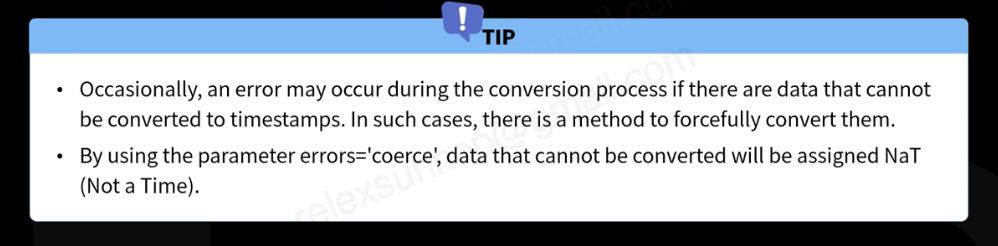

In [44]:
## The original DATE column, which was of the object date type, has been removed.
df = wti.drop(['DATE'], axis = 1)
df.head()

,DCOILWTICO,N_DATE
0,69.87,2018-09-18
1,71.08,2018-09-19
2,70.77,2018-09-20
3,70.8,2018-09-21
4,73.23,2018-09-24


In [45]:
## The newly created 'datetime64' column is set as the index of the DataFrame.
df.set_index('N_DATE', inplace = True)
df.head()

,DCOILWTICO
N_DATE,
2018-09-18,69.87
2018-09-19,71.08
2018-09-20,70.77
2018-09-21,70.8
2018-09-24,73.23


In [46]:
## Now, this DataFrame is well-suited for indexing or slicing based on the chronological 
## order of time.
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1305 entries, 2018-09-18 to 2023-09-18
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   DCOILWTICO  1305 non-null   object
dtypes: object(1)
memory usage: 20.4+ KB


## 6.2 Slicing using DatetimeIndex

In [49]:
df['2019-06-04':'2019-06-10'] 
## It is very convenient to slice only the desired data by selecting specific dates.

,DCOILWTICO
N_DATE,
2019-06-04,53.5
2019-06-05,51.57
2019-06-06,52.59
2019-06-07,53.95
2019-06-10,53.33


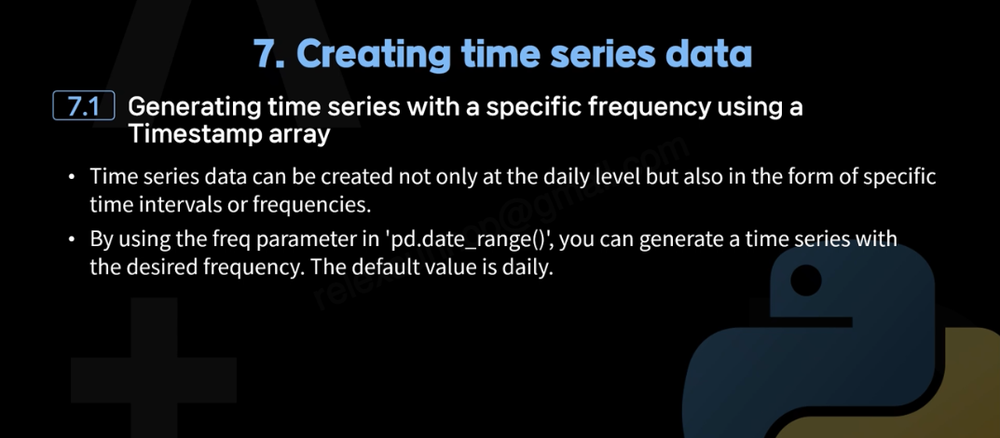

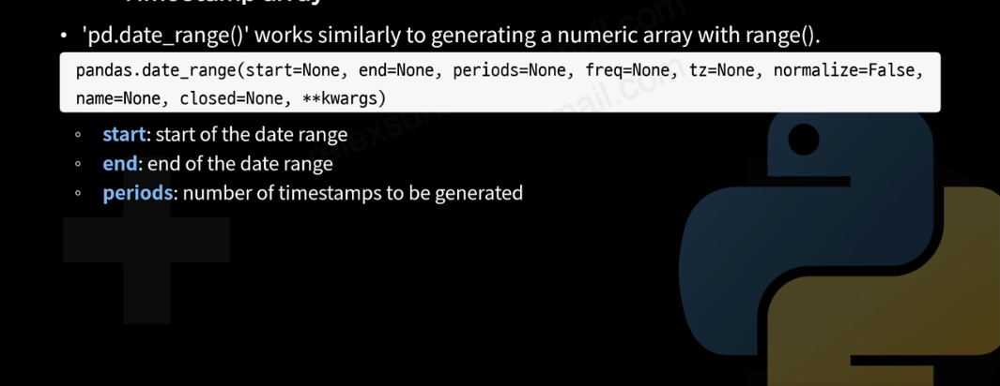

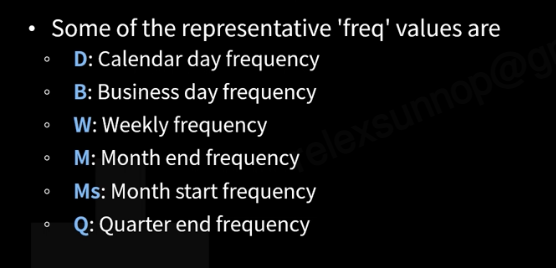

In [50]:
import pandas as pd
pd.date_range(start = '2021-01-01', end = None, periods = 5, freq = 'D', tz = None)

DatetimeIndex(['2021-01-01', '2021-01-02', '2021-01-03', '2021-01-04',
               '2021-01-05'],
              dtype='datetime64[ns]', freq='D')

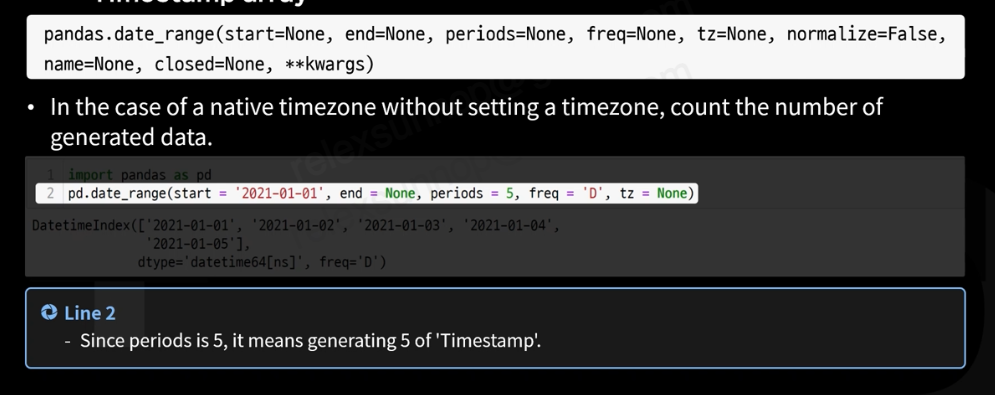

In [51]:
import pandas as pd
pd.date_range(start = '2021-01-01', end = '2021-12-31', periods = 5, freq = None, tz = 'Asia/Seoul')

DatetimeIndex(['2021-01-01 00:00:00+09:00', '2021-04-02 00:00:00+09:00',
               '2021-07-02 00:00:00+09:00', '2021-10-01 00:00:00+09:00',
               '2021-12-31 00:00:00+09:00'],
              dtype='datetime64[ns, Asia/Seoul]', freq=None)

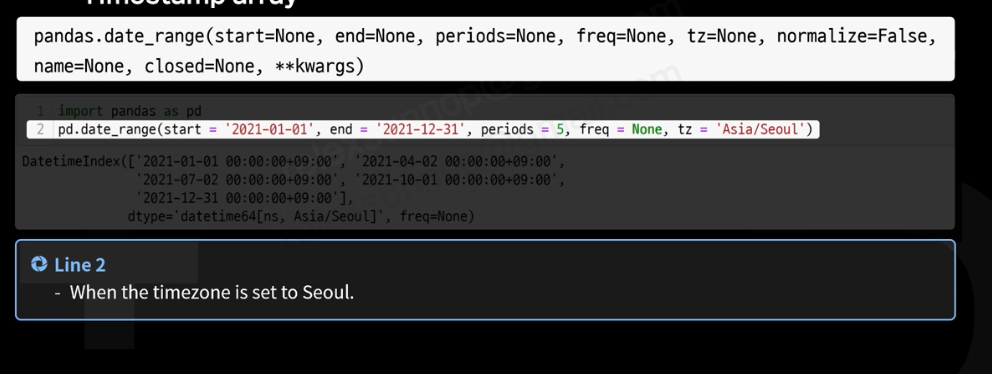

In [53]:
import pandas as pd
pd.date_range(start = '2021-01-01', end = None, periods = 5, freq = 'M', tz = 'Asia/Seoul')

DatetimeIndex(['2021-01-31 00:00:00+09:00', '2021-02-28 00:00:00+09:00',
               '2021-03-31 00:00:00+09:00', '2021-04-30 00:00:00+09:00',
               '2021-05-31 00:00:00+09:00'],
              dtype='datetime64[ns, Asia/Seoul]', freq='M')

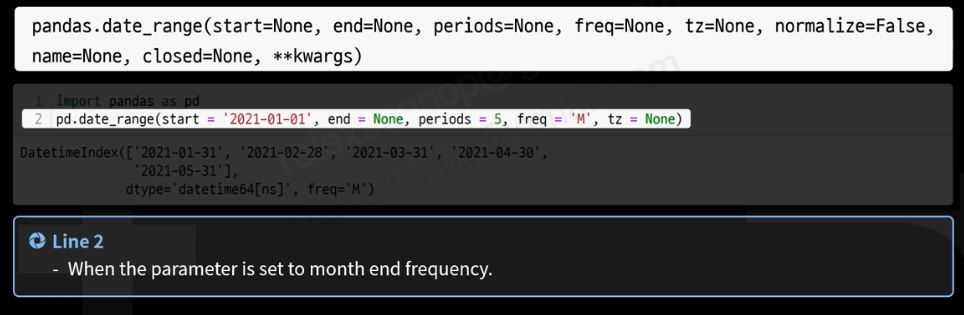

In [54]:
import pandas as pd
pd.date_range(start = '2021-01-01', end = None, periods = 5, freq = 'Ms', tz = 'Asia/Seoul')

DatetimeIndex([       '2021-01-01 00:00:00+09:00',
               '2021-01-01 00:00:00.001000+09:00',
               '2021-01-01 00:00:00.002000+09:00',
               '2021-01-01 00:00:00.003000+09:00',
               '2021-01-01 00:00:00.004000+09:00'],
              dtype='datetime64[ns, Asia/Seoul]', freq='L')

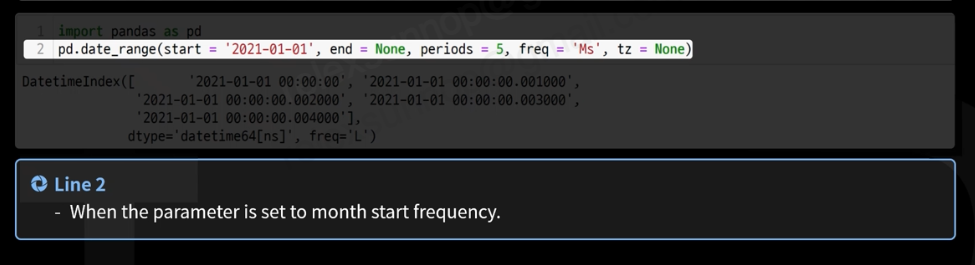

## 7.2 Generating time series with a specific frequency using a period array

In [57]:
import pandas as pd

p_data = pd.period_range(start = '2021-1-1', ## Start of the date range.
                         end = '2021-12-31', ## End of the date range.
                         periods = None, ## Length of the periods.
                         freq = 'M' ## Frequency unit to generate.
                        )
p_data

PeriodIndex(['2021-01', '2021-02', '2021-03', '2021-04', '2021-05', '2021-06',
             '2021-07', '2021-08', '2021-09', '2021-10', '2021-11', '2021-12'],
            dtype='period[M]')

In [59]:
## It automatically generates the starting and ending dates for each month.
for i in p_data :
    print("{0} {1}".format(i.start_time, i.end_time))

2021-01-01 00:00:00 2021-01-31 23:59:59.999999999
2021-02-01 00:00:00 2021-02-28 23:59:59.999999999
2021-03-01 00:00:00 2021-03-31 23:59:59.999999999
2021-04-01 00:00:00 2021-04-30 23:59:59.999999999
2021-05-01 00:00:00 2021-05-31 23:59:59.999999999
2021-06-01 00:00:00 2021-06-30 23:59:59.999999999
2021-07-01 00:00:00 2021-07-31 23:59:59.999999999
2021-08-01 00:00:00 2021-08-31 23:59:59.999999999
2021-09-01 00:00:00 2021-09-30 23:59:59.999999999
2021-10-01 00:00:00 2021-10-31 23:59:59.999999999
2021-11-01 00:00:00 2021-11-30 23:59:59.999999999
2021-12-01 00:00:00 2021-12-31 23:59:59.999999999


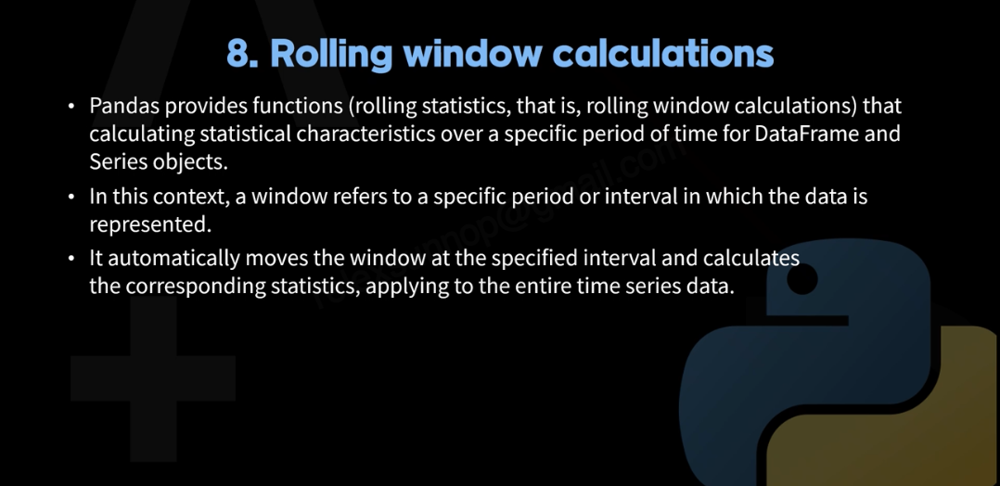

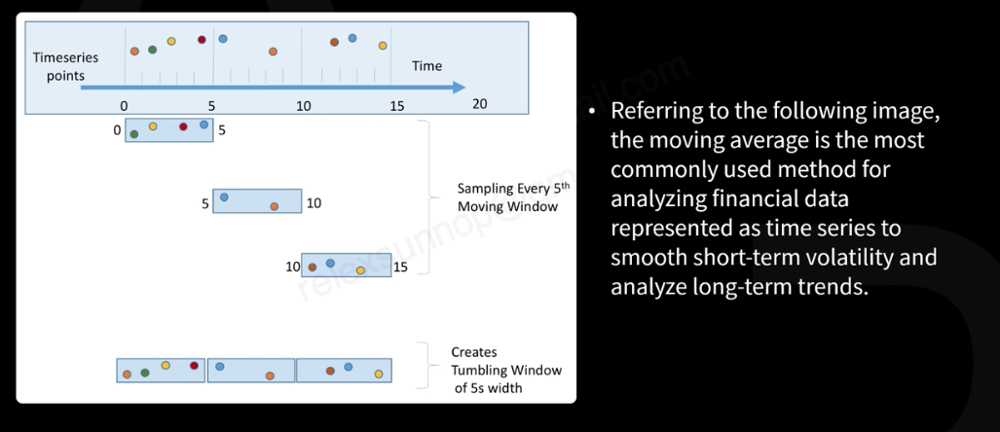

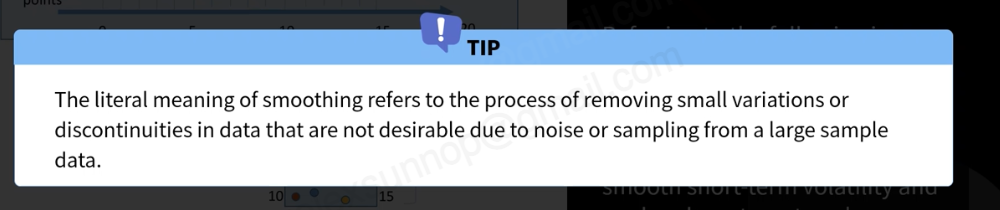

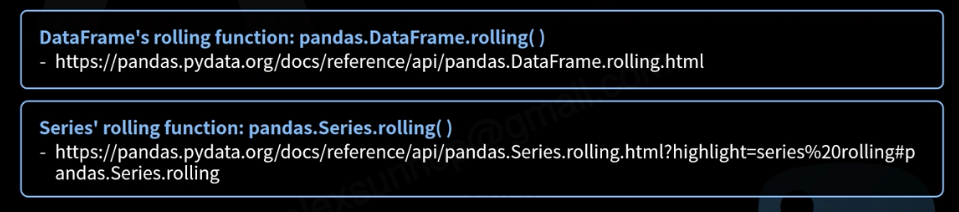

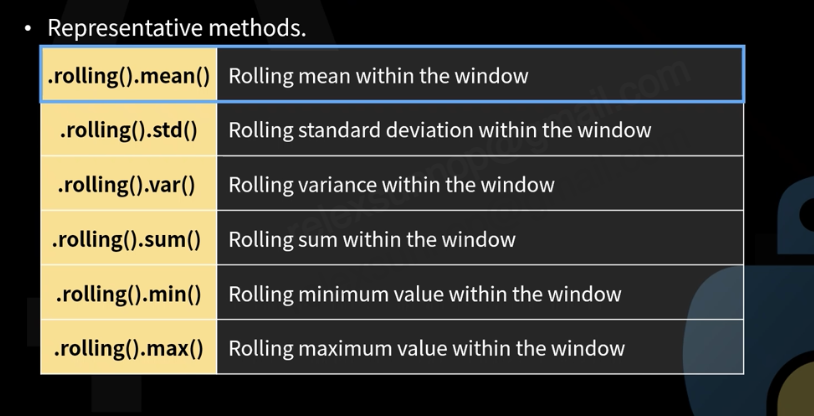

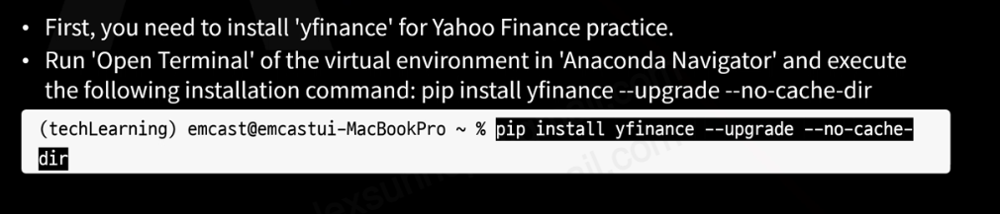

The start date is set using the timestamp stored in the variable `start`, and the end date is set using the timestamp stored in the variable `end`.

In [2]:
import yfinance as yf

symbol = '005930.KS' ## Stock code, Samsung Electronics
start = '2020-01-01'
end = '2020-12-31'
 
sec = yf.download(symbol, start=start, end=end)
sec

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-01-02,55500.0,56000.0,55000.0,55200.0,49542.531250,12993228
2020-01-03,56000.0,56600.0,54900.0,55500.0,49811.785156,15422255
2020-01-06,54900.0,55600.0,54600.0,55500.0,49811.785156,10278951
2020-01-07,55700.0,56400.0,55600.0,55800.0,50081.042969,10009778
2020-01-08,56200.0,57400.0,55900.0,56800.0,50978.554688,23501171
...,...,...,...,...,...,...
2020-12-23,72400.0,74000.0,72300.0,73900.0,67676.179688,19411326
2020-12-24,74100.0,78800.0,74000.0,77800.0,71247.718750,32502870
2020-12-28,79000.0,80100.0,78200.0,78700.0,72071.921875,40085044


In [62]:
sec.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 248 entries, 2020-01-02 to 2020-12-30
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       248 non-null    float64
 1   High       248 non-null    float64
 2   Low        248 non-null    float64
 3   Close      248 non-null    float64
 4   Adj Close  248 non-null    float64
 5   Volume     248 non-null    int64  
dtypes: float64(5), int64(1)
memory usage: 13.6 KB


In [64]:
ma5 = sec['Adj Close'].rolling(window = 5).mean()
ma5.head(10)
## The data for a 5-day moving average can be easily calculated.

Date
2020-01-02             NaN
2020-01-03             NaN
2020-01-06             NaN
2020-01-07             NaN
2020-01-08    50545.036719
2020-01-09    51161.439844
2020-01-10    51886.619531
2020-01-13    52702.446875
2020-01-14    53463.887500
2020-01-15    53862.736719
Name: Adj Close, dtype: float64

Text(0, 0.5, 'close price')

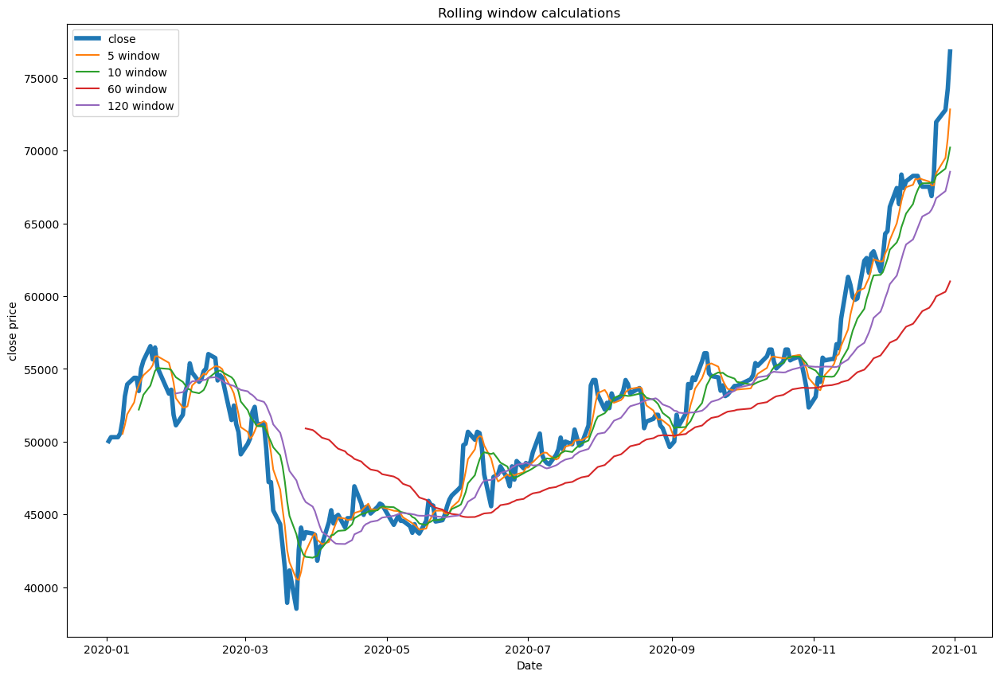

In [65]:
import matplotlib.pyplot as plt

close = sec['Adj Close']
ma5 = close.rolling(window = 5).mean()
ma10 = close.rolling(window = 10).mean()
ma60 = close.rolling(window = 60).mean()
ma120 = close.rolling(window = 20).mean()

plt.figure(figsize = (15, 10))

plt.plot(close, label = 'close', linewidth = 4)
plt.plot(ma5, label = '5 window')
plt.plot(ma10, label = '10 window')
plt.plot(ma60, label = '60 window')
plt.plot(ma120, label = '120 window')

plt.legend()
plt.title('Rolling window calculations')
plt.xlabel('Date')
plt.ylabel('close price')

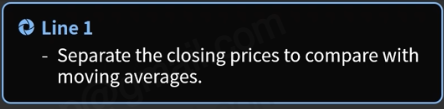

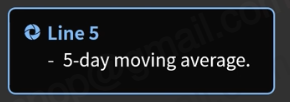

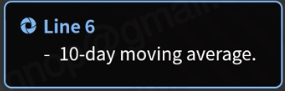

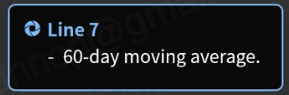

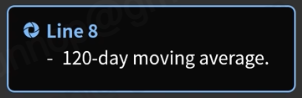

...

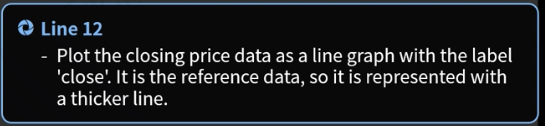

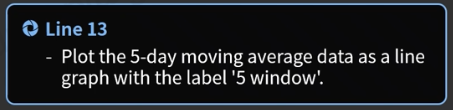

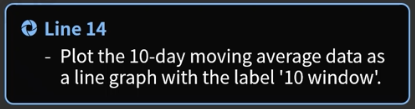

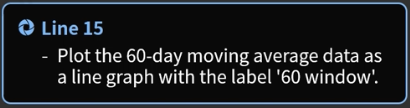

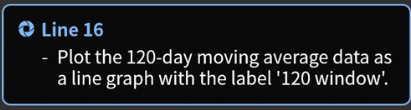

---

# 3. Let's code
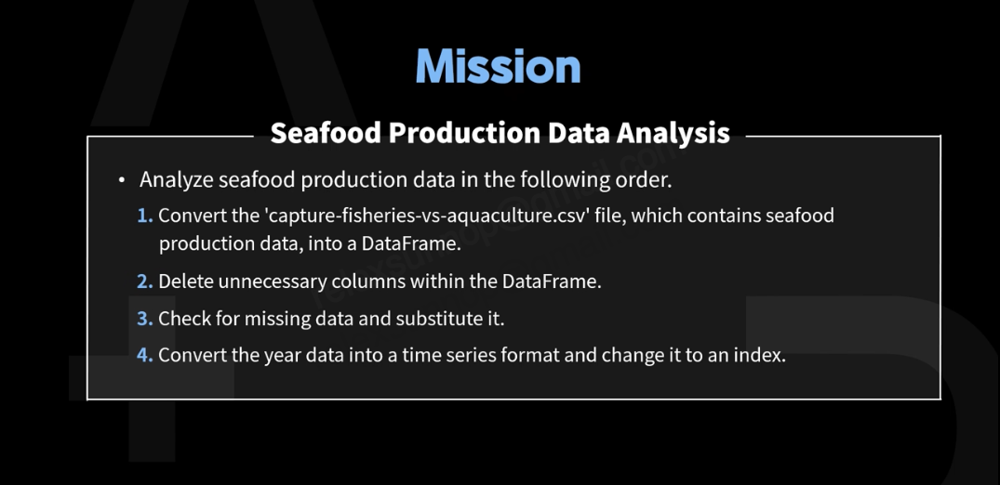

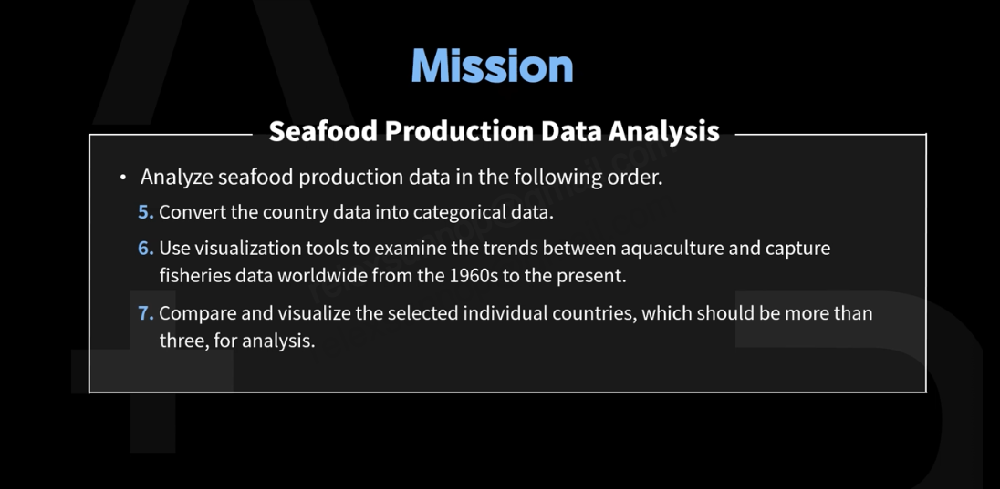

In [81]:
import pandas as pd

df = pd.read_csv("./data/capture-and-aquaculture-production.csv")
df.head()

,Entity,Code,Year,Aquaculture production (metric tons),Capture fisheries production (metric tons)
0,Afghanistan,AFG,1960,0.0,200.0
1,Afghanistan,AFG,1961,0.0,300.0
2,Afghanistan,AFG,1962,0.0,300.0
3,Afghanistan,AFG,1963,0.0,300.0
4,Afghanistan,AFG,1964,0.0,300.0


In [82]:
## Check the data types of each column in the DataFrame.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14030 entries, 0 to 14029
Data columns (total 5 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   Entity                                      14030 non-null  object 
 1   Code                                        13115 non-null  object 
 2   Year                                        14030 non-null  int64  
 3   Aquaculture production (metric tons)        12810 non-null  float64
 4   Capture fisheries production (metric tons)  14030 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 548.2+ KB


In [83]:
## Deleting the 'Code' column as it is not required for the statistics we are interested in.
df.drop(['Code'], axis = 1, inplace = True)
df.head()

,Entity,Year,Aquaculture production (metric tons),Capture fisheries production (metric tons)
0,Afghanistan,1960,0.0,200.0
1,Afghanistan,1961,0.0,300.0
2,Afghanistan,1962,0.0,300.0
3,Afghanistan,1963,0.0,300.0
4,Afghanistan,1964,0.0,300.0


In [86]:
df.isnull().sum()

Entity                                           0
Year                                             0
Aquaculture production (metric tons)          1220
Capture fisheries production (metric tons)       0
dtype: int64

In [90]:
## Creating a variable with the desired replacement data.
change_value = 0

## Replace NaN with 0 to avoid affecting aggregated statistics.
df.fillna(change_value, inplace = True) 
df.isnull().sum()
## After the substitution, check the results to confirm that all NaN data has been 
## replaced with 0, indicating no remaining NaN values.
 

Entity                                        0
Year                                          0
Aquaculture production (metric tons)          0
Capture fisheries production (metric tons)    0
dtype: int64

In [91]:
df['new_Year'] = pd.to_datetime(df['Year'].astype(str), format = '%Y')
df.set_index('new_Year', inplace = True)
df.drop(['Year'], axis = 1, inplace = True)

df.head()

,Entity,Aquaculture production (metric tons),Capture fisheries production (metric tons)
new_Year,,,
1960-01-01,Afghanistan,0.0,200.0
1961-01-01,Afghanistan,0.0,300.0
1962-01-01,Afghanistan,0.0,300.0
1963-01-01,Afghanistan,0.0,300.0
1964-01-01,Afghanistan,0.0,300.0


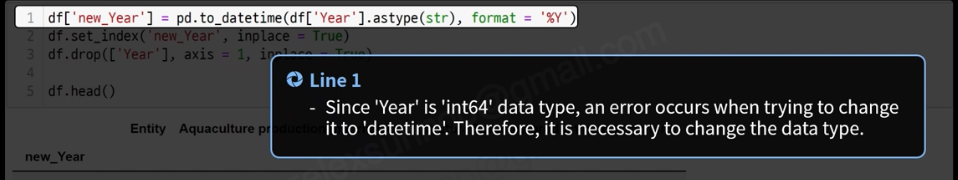

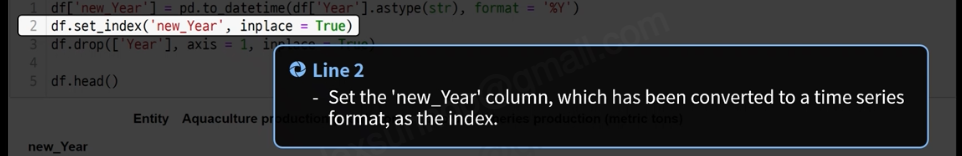

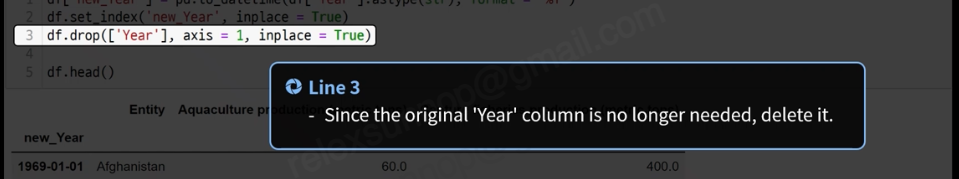

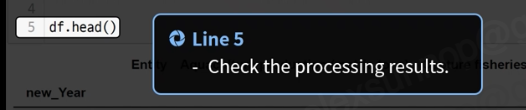

In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 14030 entries, 1960-01-01 to 2020-01-01
Data columns (total 3 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   Entity                                      14030 non-null  object 
 1   Aquaculture production (metric tons)        14030 non-null  float64
 2   Capture fisheries production (metric tons)  14030 non-null  float64
dtypes: float64(2), object(1)
memory usage: 438.4+ KB


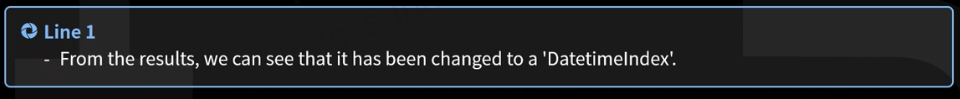

In [97]:
new_df = df.sort_index()
new_df.head()

,Entity,Aquaculture production (metric tons),Capture fisheries production (metric tons)
new_Year,,,
1960-01-01,Afghanistan,0.0,200.0
1960-01-01,Nepal,0.0,1300.0
1960-01-01,Bahrain,0.0,1500.0
1960-01-01,Netherlands,77600.0,225800.0
1960-01-01,New Caledonia,0.0,400.0


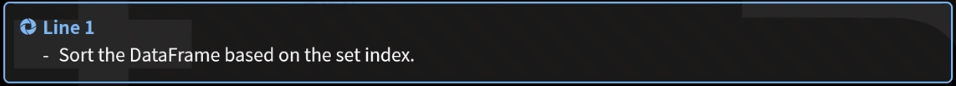

In [100]:
new_df['Entity'] = new_df['Entity'].astype('category')
new_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 14030 entries, 1960-01-01 to 2020-01-01
Data columns (total 3 columns):
 #   Column                                      Non-Null Count  Dtype   
---  ------                                      --------------  -----   
 0   Entity                                      14030 non-null  category
 1   Aquaculture production (metric tons)        14030 non-null  float64 
 2   Capture fisheries production (metric tons)  14030 non-null  float64 
dtypes: category(1), float64(2)
memory usage: 366.1 KB


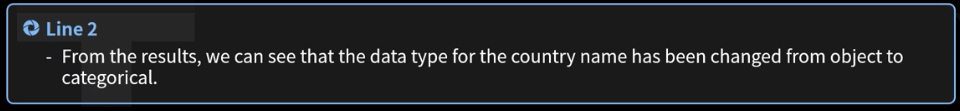

In [101]:
new_df['Entity'].value_counts()

Afghanistan      61
Nauru            61
Netherlands      61
New Caledonia    61
New Zealand      61
                 ..
Greece           61
Greenland        61
Grenada          61
Guam             61
Zimbabwe         61
Name: Entity, Length: 230, dtype: int64

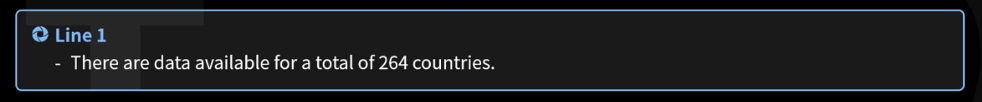

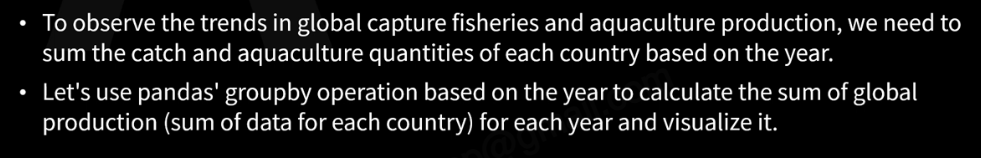

In [102]:
g = new_df.groupby(['new_Year'])

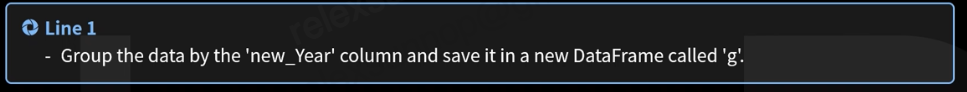

In [103]:
g.head()

,Entity,Aquaculture production (metric tons),Capture fisheries production (metric tons)
new_Year,,,
1960-01-01,Afghanistan,0.0,200.00
1960-01-01,Nepal,0.0,1300.00
1960-01-01,Bahrain,0.0,1500.00
1960-01-01,Netherlands,77600.0,225800.00
1960-01-01,New Caledonia,0.0,400.00
...,...,...,...
2020-01-01,Zambia,45670.0,106836.00
2020-01-01,Yemen,0.0,131306.52
2020-01-01,World,122580056.0,91336070.00


In [104]:
for key, group in g :
    print('+key', key)
    print('+number', len(group))
    print(group.head())
    print('\n')

+key 1960-01-01 00:00:00
+number 230
                   Entity  Aquaculture production (metric tons)  \
new_Year                                                          
1960-01-01    Afghanistan                                   0.0   
1960-01-01          Nepal                                   0.0   
1960-01-01        Bahrain                                   0.0   
1960-01-01    Netherlands                               77600.0   
1960-01-01  New Caledonia                                   0.0   

            Capture fisheries production (metric tons)  
new_Year                                                
1960-01-01                                       200.0  
1960-01-01                                      1300.0  
1960-01-01                                      1500.0  
1960-01-01                                    225800.0  
1960-01-01                                       400.0  


+key 1961-01-01 00:00:00
+number 230
                                Entity  Aquaculture pro

/var/folders/_l/vk8195hj27dddx00btc_ymdm0000gn/T/ipykernel_1956/73703357.py:1: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for key, group in g :


In [105]:
world_total = g.sum(numeric_only = True)
world_total.head()

,Aquaculture production (metric tons),Capture fisheries production (metric tons)
new_Year,,
1960-01-01,9682792.0,143319392.0
1961-01-01,9169680.0,160282707.0
1962-01-01,9505308.0,174771466.0
1963-01-01,10636561.0,177921525.1
1964-01-01,11581704.0,197686787.1


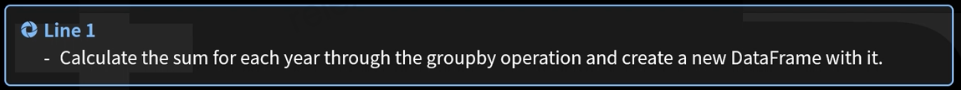

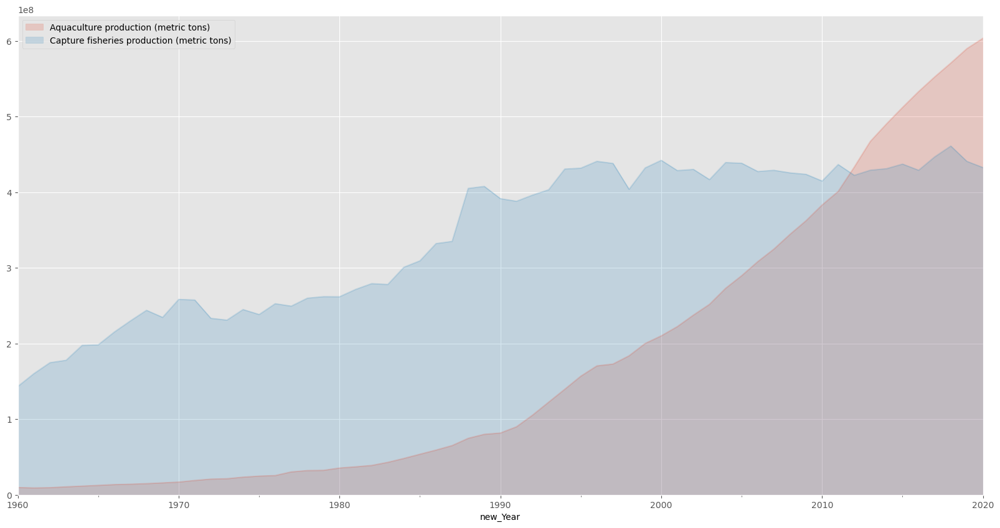

In [106]:
plt.style.use('ggplot') ## Specify the style of the graph.

## Draw the line graph as an area graph where the remaining area is filled with color.
## Adjust the opacity of the colors to enhance visibility for overlapping graphs.
## Set the 'stacked' parameter to 'False'.
## Specify the size of the graph.
world_total.plot(kind = 'area',
                 alpha = 0.2,
                 stacked = False,
                 figsize = (20, 10)
                )

plt.legend() ## Display the legend.
plt.show() 

In [107]:
country = new_df['Entity'].value_counts()
print(country)
print("Data type =>", type(country))

Afghanistan      61
Nauru            61
Netherlands      61
New Caledonia    61
New Zealand      61
                 ..
Greece           61
Greenland        61
Grenada          61
Guam             61
Zimbabwe         61
Name: Entity, Length: 230, dtype: int64
Data type => <class 'pandas.core.series.Series'>


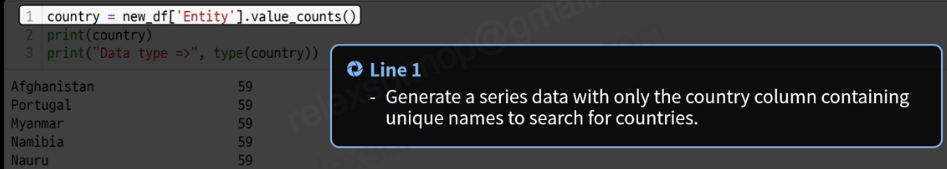

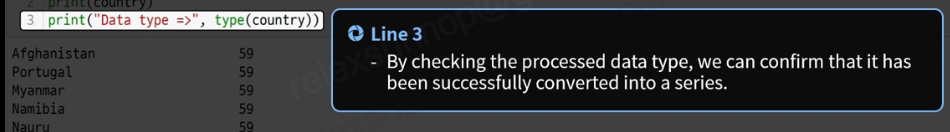

In [108]:
'Cambodia' in country

True

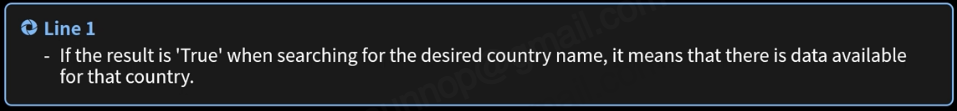

In [109]:
s = new_df.loc[new_df['Entity'] == 'South Korea']
c = new_df.loc[new_df['Entity'] == 'Cambodia']
u = new_df.loc[new_df['Entity'] == 'United State']

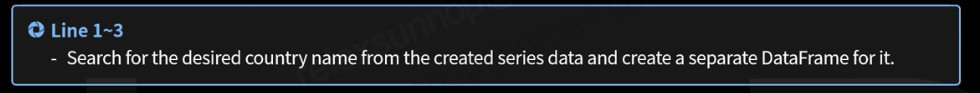

In [112]:
s_y = s[['Aquaculture production (metric tons)', 'Capture fisheries production (metric tons)']]
s_x = s.index

c_y = c[['Aquaculture production (metric tons)', 'Capture fisheries production (metric tons)']]
c_x = c.index

u_y = u[['Aquaculture production (metric tons)', 'Capture fisheries production (metric tons)']]
u_x = u.index

Text(0.5, 0.98, 'Fish Production')

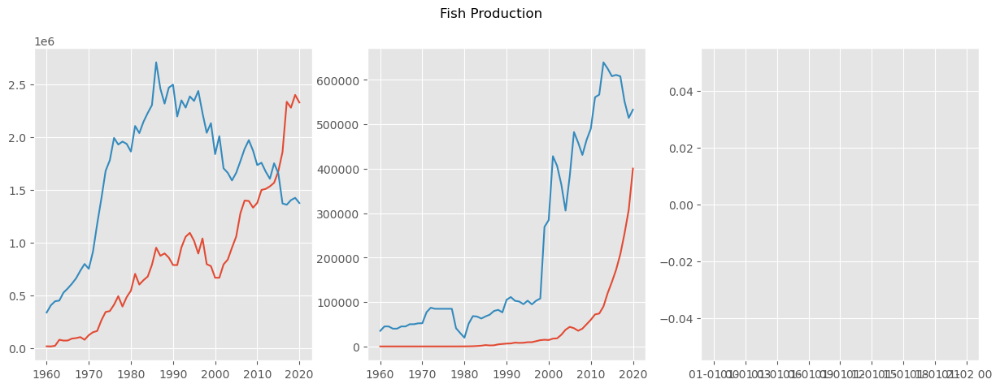

In [115]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 3, figsize = (15, 5))
axs[0].plot(s_x, s_y)
axs[1].plot(c_x, c_y)
axs[2].plot(u_x, u_y)
fig.suptitle('Fish Production')

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("./data/capture-fisheries-vs-aquaculture.csv")
print(df.head())

print('\n <Basic information for data>')
print(df.info()) 

print('\n <Delete Unnecessary Columns>')
df.drop(['Code'], axis = 1, inplace = True)
print(df.head())

print('\n <Check missing values>')
print(df.isnull().sum()) 
print('\n => Replace missing value with zero')
change_value = 0
df.fillna(change_value, inplace = True)
print('\n <Check missing values>')
print(df.isnull().sum())

print('\n <Converts year data to time series data types and replaces indexes>')
df['new_Year'] = pd.to_datetime(df['Year'].astype(str), format = '%Y')
df.set_index('new_Year', inplace = True)
df.drop(['Year'], axis = 1, inplace = True)
print(df.head()) 

print('\n <Convert country data to categorical data>')
new_df = df.sort_index()
new_df['Entity'] = new_df['Entity'].astype('category')
print(new_df.info())

print('\n <Check the number of unique data per country>')
print(new_df['Entity'].value_counts())

print('\n <Trends in data between Aquaculture and Capture fisheries production \
            worldwide from the 1960s to the present>')
g = new_df.groupby(['new_Year'])
world_total = g.sum(numeric_only = True)
plt.style.use('ggplot')
world_total.plot(kind = 'area', alpha = 0.2, stacked = False, figsize = (20, 10) )
plt.legend()
plt.show()

print('\n <Compare visualizations of individual countries>')
s = new_df.loc[new_df['Entity'] == 'South Korea']
c = new_df.loc[new_df['Entity'] == 'China']
a = new_df.loc[new_df['Entity'] == 'Afghanistan']
s_y = s[['Aquaculture production (metric tons)', 'Capture fisheries production (metric tons)']]
s_x = s.index
c_y = c[['Aquaculture production (metric tons)', 'Capture fisheries production (metric tons)']]
c_x = c.index
a_y = a[['Aquaculture production (metric tons)', 'Capture fisheries production (metric tons)']]
a_x = a.index
fig, axs = plt.subplots(1, 3, figsize = (15, 5))
axs[0].plot(s_x, s_y)
axs[1].plot(c_x, c_y)
axs[2].plot(a_x, a_y)
fig.suptitle('Fish Production')
plt.show()

---

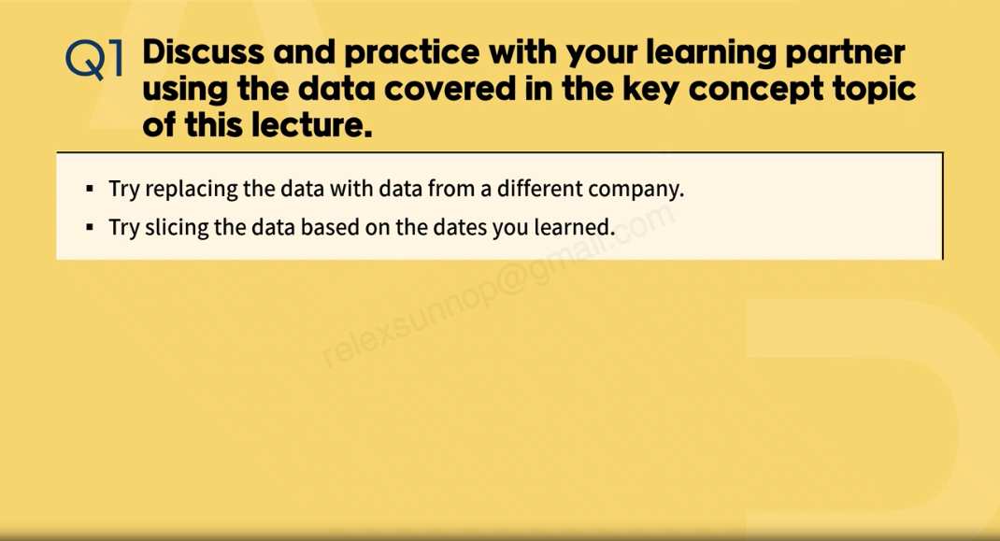

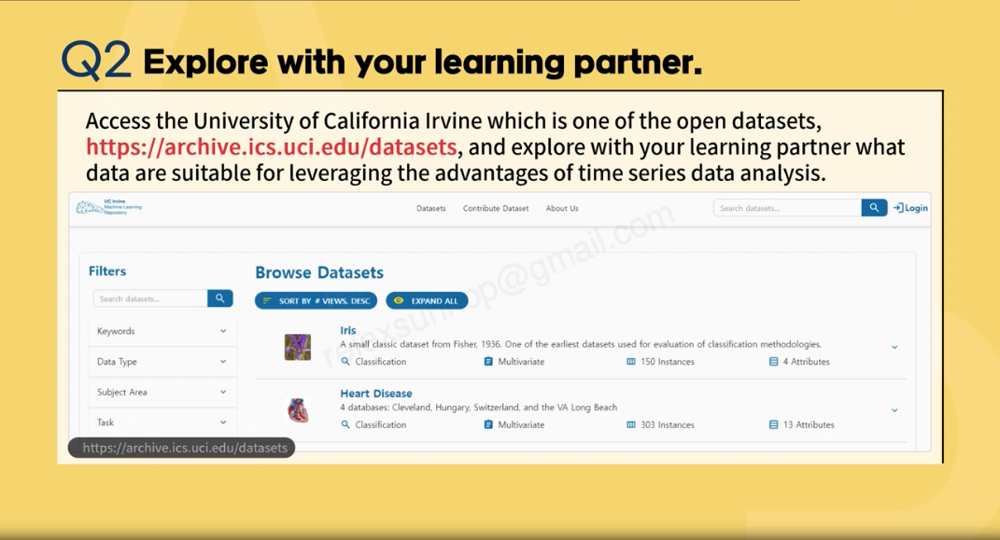